In [1]:
import cv2
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sys
import scanpy as sc
import anndata as ad
import scipy.sparse as sp
from matplotlib import rcParams

# Pre-process

In [2]:
srt_data_folder_path = "../datasets/srt_data" # spatially resolved transcriptomics data
srt_data_bronze_folder_path = f"{srt_data_folder_path}/bronze"
srt_data_silver_folder_path = f"{srt_data_folder_path}/silver"
srt_data_gold_folder_path = f"{srt_data_folder_path}/gold"
srt_data_irene_folder_path = f"{srt_data_folder_path}/irene_temp"

In [3]:
dataset = "nanostring_cosmx_human_nsclc"

In [40]:
adata_sample_list = []
samples = os.listdir(f'{srt_data_bronze_folder_path}/{dataset}')
samples = [sample for sample in samples if 'Lung' in sample]

for sample in samples:
    print(sample)
    batch_id = sample.replace('Lung', '')
    batch_id = batch_id.replace('Rep', '')
    
    # Load data
    gene_expr_df = pd.read_csv(f"{srt_data_bronze_folder_path}/{dataset}/{sample}/{sample}-Flat_files_and_images/{sample}_exprMat_file.csv")
    gene_expr_df.index = gene_expr_df.index.astype(str)
    metadata_df = pd.read_csv(f"{srt_data_bronze_folder_path}/{dataset}/{sample}/{sample}-Flat_files_and_images/{sample}_metadata_file.csv")
    metadata_df.index = metadata_df.index.astype(str)

    # Create adata
    adata = ad.AnnData(gene_expr_df[gene_expr_df.columns.difference(["fov", "cell_ID"])],
                       obs=gene_expr_df[["fov", "cell_ID"]],
                       dtype = "float32")
    tmp_obs = pd.merge(adata.obs, metadata_df, on=["fov", "cell_ID"], how="left")
    tmp_obs.index = tmp_obs.index.astype(str)
    adata.obs = tmp_obs
    adata.X = sp.csr_matrix(adata.X) # sparse
    adata.layers["counts"] = adata.X
    print(adata.shape)

    # Filter genes
    adata = adata[:, ~adata.var_names.str.contains("NegPrb")]

    # Filter cells
    # min counts
    sc.pp.filter_cells(adata, min_counts=50)
    # no metadata
    adata.obs.reset_index(drop=True, inplace=True)
    adata = adata[adata.obs.index.isin(adata.obs.dropna().index), :]

    # Process metadata
    # spatial data in obsm
    adata.obsm["spatial"] = np.array(adata.obs[["CenterX_global_px", "CenterY_global_px"]])
    adata.obs = adata.obs[["fov", "cell_ID"]]

    # sample number
    adata.obs["sample"] = sample.lower()
    if len(batch_id.split('_')) == 1:
        adata.obs["sample_id"] = int(batch_id)
        adata.obs["replicate_id"] = np.nan
        adata.obs["replicate_id"] = adata.obs["replicate_id"].astype('Int64')
    else:
        adata.obs["sample_id"] = int(batch_id.split('_')[0])
        adata.obs["replicate_id"] = int(batch_id.split('_')[1])

    # Write
    adata.write(f"{srt_data_gold_folder_path}/{dataset}_batch{batch_id}.h5ad")
    print(adata.shape)

    # Normalize counts
    sc.pp.normalize_total(adata, target_sum=1e4)

    # Log-transform the normalized counts
    sc.pp.log1p(adata)
    
    adata_sample_list.append(adata)
    
adata = ad.concat(adata_sample_list, join="inner")

Lung6
(93825, 980)


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


(83872, 960)
Lung9_Rep1
(91992, 980)


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


(77403, 960)
Lung5_Rep1
(100322, 980)


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


(93250, 960)
Lung12
(74025, 980)


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


(66624, 960)
Lung13
(82863, 980)


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


(76548, 960)
Lung5_Rep3
(100294, 980)


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


(91758, 960)
Lung9_Rep2
(150549, 980)


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


(115716, 960)
Lung5_Rep2
(106689, 980)


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_counts'] = number
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


(97589, 960)


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [6]:
# raw counts for scVI
adata_sample_list = []
samples = os.listdir(f'{srt_data_gold_folder_path}')
samples = [sample for sample in samples if 'batch' in sample]

for sample in samples:
    adata_sample_list.append(sc.read_h5ad(f'{srt_data_gold_folder_path}/{sample}'))
adata = ad.concat(adata_sample_list, join="inner")
adata.obs_names = adata.obs['sample'].astype(str)+'_'+adata.obs['fov'].astype(str)+'_'+adata.obs['cell_ID'].astype(str)

/home/icb/irene.bonafonte/miniconda3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [16]:
sample = 'Lung9_Rep1'
annotations = pd.read_csv(f"{srt_data_bronze_folder_path}/{dataset}/{sample}/{sample}-Flat_files_and_images/matched_annotation_all.csv")
# annotations = pd.read_csv('../datasets/spatialTranscriptomics/nanostring_CosMxSMI_NSCLC/annotated_SiGra/matched_annotation_all.csv')
annotations['idx'] = annotations['fov'].astype(str) + '_' + annotations['cell_ID'].astype(str)
annotations = annotations.set_index('idx')
adata.obs['idx'] = adata.obs['fov'].astype(str) + '_' + adata.obs['cell_ID'].astype(str)
cells_bool = (adata.obs['sample']=='lung9_rep1') & adata.obs['idx'].isin(annotations.index)

adata.obs[['cell_type','niche']] = "Unknown"
adata.obs.loc[cells_bool, ['cell_type','niche']] = annotations.loc[adata.obs.loc[cells_bool,'idx'],['cell_type','niche']].values
adata.obs.drop(columns=['idx'], inplace=True)
adata.obs['replicate_id'] = adata.obs.replicate_id.astype('Int64')

# add broader cell types
adata.obs['cell_type_simplified'] = adata.obs['cell_type'].astype(str)
adata.obs.loc[adata.obs['cell_type'].apply(lambda x: 'T' in x),'cell_type_simplified'] = 'NK/T cell'
adata.obs.loc[adata.obs['cell_type'] == 'NK','cell_type_simplified'] = 'NK/T cell'
adata.obs.loc[adata.obs['cell_type'].apply(lambda x: 'DC' in x),'cell_type_simplified'] = 'DC'
adata.obs.loc[(adata.obs['cell_type'] == 'monocyte') | (adata.obs['cell_type'] == 'macrophage') | (adata.obs['cell_type_simplified'] == 'DC'),'cell_type_simplified'] = 'myeloid'

In [17]:
adata.obs['cell_type_simplified'] = adata.obs['cell_type'].astype(str)
adata.obs.loc[adata.obs['cell_type'].apply(lambda x: 'T' in x),'cell_type_simplified'] = 'NK/T cell'
adata.obs.loc[adata.obs['cell_type'] == 'NK','cell_type_simplified'] = 'NK/T cell'
adata.obs.loc[adata.obs['cell_type'].apply(lambda x: 'DC' in x),'cell_type_simplified'] = 'DC'
adata.obs.loc[(adata.obs['cell_type'] == 'monocyte') | (adata.obs['cell_type'] == 'macrophage') | (adata.obs['cell_type_simplified'] == 'DC'),'cell_type_simplified'] = 'myeloid'

In [9]:
adata.write(f"{srt_data_gold_folder_path}/{dataset}_all_raw.h5ad") # counts
# adata.write(f"{srt_data_gold_folder_path}/{dataset}_all.h5ad") # log1p

In [38]:
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

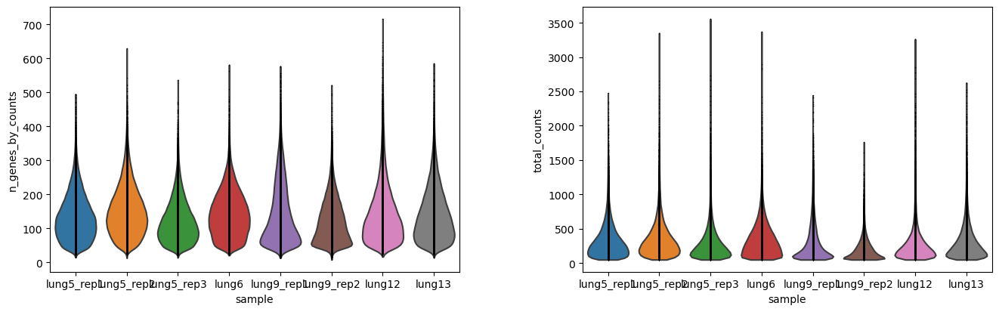

In [40]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'], jitter=0, multi_panel=True, groupby='sample')

In [46]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, batch_key='sample',)

/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/preprocessing/_highly_var

In [54]:
adata.var.highly_variable.value_counts()

False    800
True     160
Name: highly_variable, dtype: int64

/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/preprocessing/_highly_var

False    800
True     160
Name: highly_variable, dtype: int64

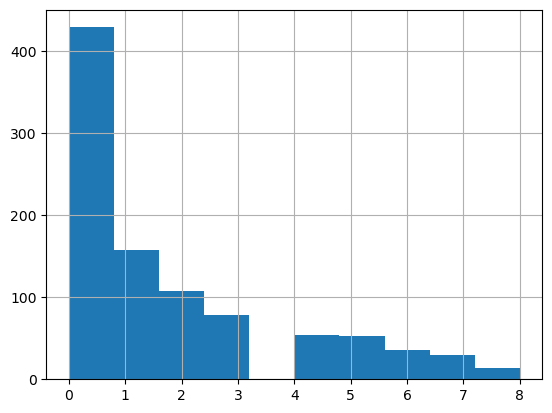

In [58]:
sc.pp.highly_variable_genes(adata, batch_key='sample')
adata.var.highly_variable_nbatches.hist()
adata.var.highly_variable.value_counts()

# Cluster all samples

In [10]:
adata = sc.read_h5ad(f"{srt_data_gold_folder_path}/{dataset}_all.h5ad")

/home/icb/irene.bonafonte/miniconda3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [28]:
adata.obs_names = adata.obs['sample'].astype(str)+'_'+adata.obs['fov'].astype(str)+'_'+adata.obs['cell_ID'].astype(str)

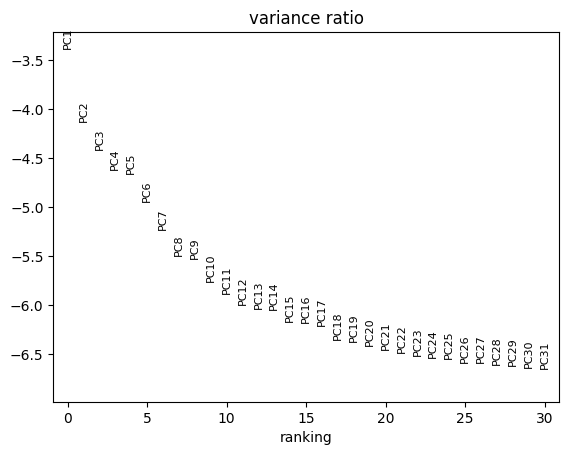

In [12]:
sc.pp.scale(adata)
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True)

## No integration

In [13]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.tl.leiden(adata)

/home/icb/irene.bonafonte/miniconda3/envs/nichecompass/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/icb/irene.bonafonte/miniconda3/envs/nichecompass/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/icb/irene.bonafonte/minico

In [41]:
adata.obsm['X_pca_umap'] = adata.obsm['X_umap']

/home/icb/irene.bonafonte/miniconda3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/irene.bonafonte/miniconda3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/irene.bonafonte/miniconda3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/irene.bonafonte/miniconda3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


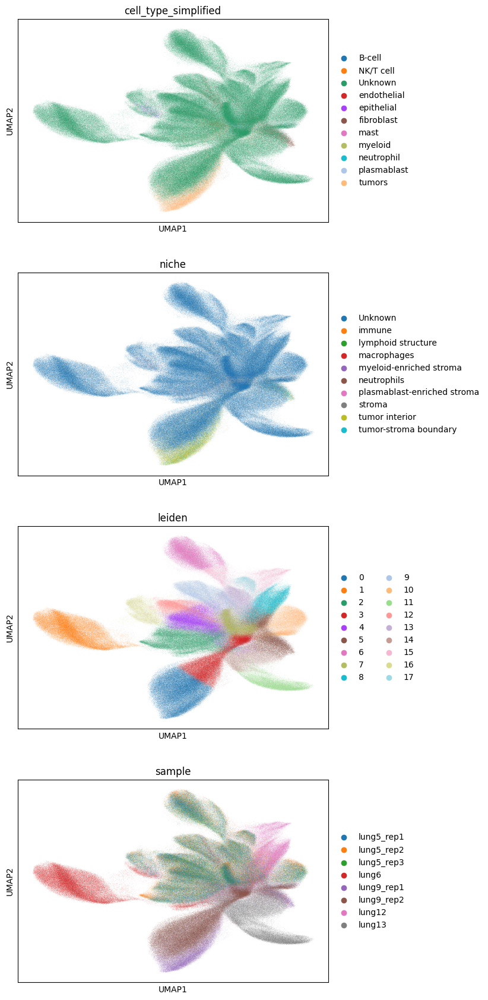

In [21]:
sc.pl.umap(adata, color=['cell_type_simplified', 'niche','leiden','sample'], ncols=1)

In [22]:
adata.write(f"{srt_data_gold_folder_path}/{dataset}_all_processed.h5ad")

## Harmony integration

In [ ]:
# pca = adata.obsm['X_pca']
# pca = pd.DataFrame(pca, index=adata.obs_names, columns=['PC'+str(i) for i in range(1,51)])
# pca.to_csv('../datasets/srt_data/irene_temp/nanostring_cosmx_human_nsclc/pca_scaled_all.csv')

In [ ]:
# import harmonypy as hm
# ho = hm.run_harmony(adata.obsm['X_pca'], adata.obs, 'sample')
# res = pd.DataFrame(ho.Z_corr)
# res.to_csv("harmony.gz", sep = "\t", index = False)

In [23]:
# harmony=pd.read_csv('../datasets/srt_data/irene_temp/nanostring_cosmx_human_nsclc/harmony_scaled_all.csv')
# harmony = harmony.T
# harmony.columns = [f'harmony_{i+1}' for i in range(harmony.shape[1])]
# harmony.index = adata.obs_names
# harmony.to_csv('../datasets/srt_data/irene_temp/nanostring_cosmx_human_nsclc/harmony_scaled_all.csv')

In [ ]:
adata.obsm['X_harmony'] = pd.read_csv('../datasets/srt_data/irene_temp/nanostring_cosmx_human_nsclc/harmony_scaled_all.csv').values

In [50]:
adata

AnnData object with n_obs × n_vars = 702760 × 960
    obs: 'fov', 'cell_ID', 'sample', 'sample_id', 'replicate_id', 'cell_type', 'niche', 'leiden', 'cell_type_simplified'
    var: 'mean', 'std'
    uns: 'pca', 'neighbors', 'umap', 'leiden', 'cell_type_colors', 'niche_colors', 'leiden_colors', 'sample_colors', 'cell_type_simplified_colors', 'nn_harmony'
    obsm: 'spatial', 'X_pca', 'X_umap', 'X_harmony', 'X_pca_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities', 'nn_harmony_distances', 'nn_harmony_connectivities'

In [ ]:
# sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40, use_rep='X_harmony', key_added='nn_harmony')
sc.tl.umap(adata, neighbors_key='nn_harmony')
# sc.tl.leiden(adata, neighbors_key='nn_harmony')
# sc.pl.umap(adata, color=['cell_type', 'cell_type_simplified', 'niche','leiden','sample'])

In [ ]:
2+2

## Combat integration

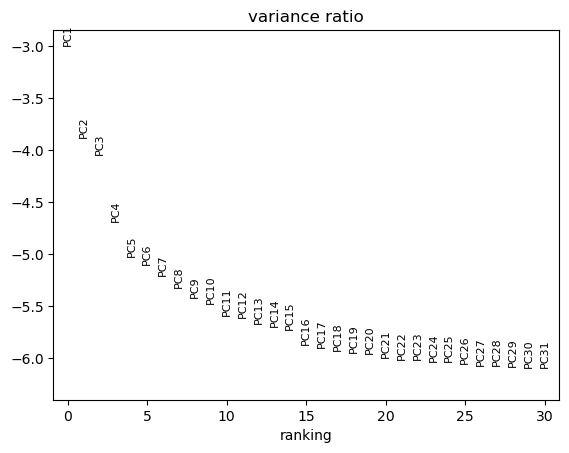

/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


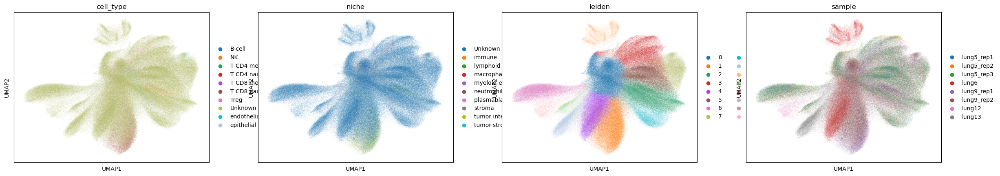

In [46]:
sc.pp.combat(adata, key='sample')
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.tl.leiden(adata)
sc.pl.umap(adata, color=['cell_type', 'niche','leiden','sample'])

/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/irene.bonafonte/miniconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


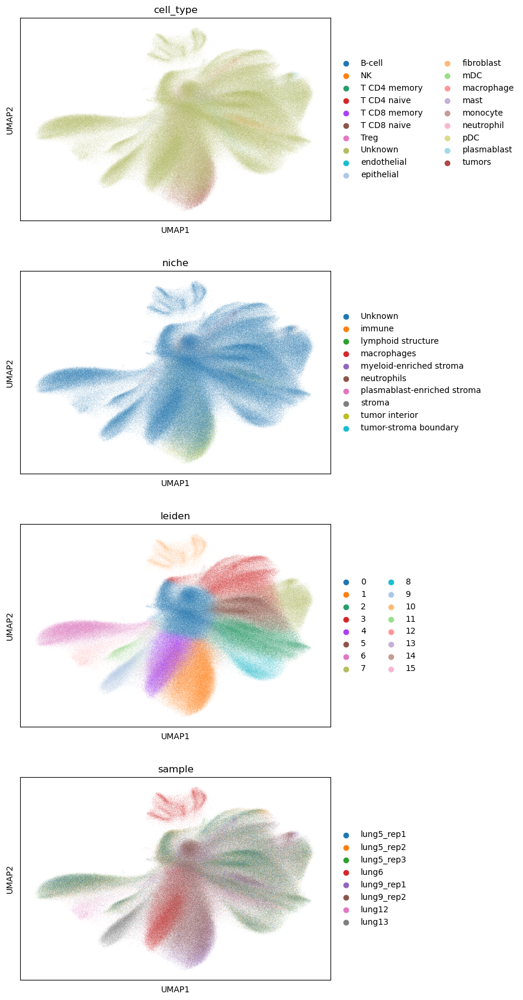

In [48]:
sc.pl.umap(adata, color=['cell_type', 'niche','leiden','sample'], ncols=1)

# Sample 9 based Cell type markers

In [24]:
def preprocess_subsample(adata, samples, n_neighbours=10, n_pcs=30, exclude_cells={}, plot_covariates=[]):
    # Subsample
    subadata = adata[adata.obs['sample'].isin(samples)].copy()
    for key, value in exclude_cells.items():
        subadata = subadata[~subadata.obs[key].isin(value)].copy()
    subadata.raw = subadata
    print(subadata.shape)
    
    # PCA, UMAP, Cluster
    sc.pp.scale(subadata)
    sc.tl.pca(subadata, svd_solver='arpack')
    rcParams['figure.figsize'] = (5, 3)
    sc.pl.pca_variance_ratio(subadata, log=True)
    sc.pp.neighbors(subadata, n_neighbors=n_neighbours, n_pcs=n_pcs)
    sc.tl.umap(subadata)
    sc.tl.leiden(subadata)
    
    # Some UMAP plots
    plot_covariates.append('leiden')
    rcParams['figure.figsize'] = (5, 3)
    sc.pl.umap(subadata, color=plot_covariates, ncols=2)
    
    return(subadata)

def cell_signatures(adata, cell_label_column, ratio_threshold=2):
    rcParams['figure.figsize'] = (5, 3)
    sc.tl.rank_genes_groups(adata, cell_label_column, method='wilcoxon')
    sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
    
    result = adata.uns['rank_genes_groups']
    deg_all = pd.DataFrame({})
    for cell in adata.obs[cell_label_column].unique():
        deg = pd.DataFrame({'pvals_adj': result['pvals_adj'][cell], 'logFC': result['logfoldchanges'][cell]},
                          index=result['names'][cell])
        deg.loc[(deg.pvals_adj > 0.05) | (deg.logFC < 0), 'pvals_adj'] = 1
        deg.sort_values(by='pvals_adj', inplace=True)
        deg.rename(columns={'pvals_adj': f'{cell}_adjPval'}, inplace=True)
        deg.drop(columns=['logFC'], inplace=True)
        deg_all = pd.merge(deg_all, deg, how="outer", left_index=True, right_index=True)

    total_signif = (deg_all != 1.0).sum(axis=1)
    total_signif.hist()
    plt.show()
    
    # 0 pvalues to min pvalue
    deg_all[deg_all == 0] = deg_all[deg_all != 0].min().min()
    
    # if a gene is differential in more than 1 cell type, keep only those that are more relevant
    # logFC(pval) > min(logFC(pval))/2
    for gene in deg_all.index.values:
        if total_signif[gene] > 1:
            logpvals = -np.log10(deg_all.loc[gene,:])
            threshold = max(logpvals)/ratio_threshold
            deg_all.loc[gene,logpvals < threshold] = 1.0

    (deg_all != 1.0).sum(axis=1).hist()
    plt.show()
    print((deg_all != 1.0).sum(axis=0))
    
    markers = {}
    for col in deg_all.columns:
        cell = col.replace('_adjPval','')
        markers[cell] = list(deg_all.index.values[deg_all[col] < 0.05])

    return(adata, markers)

def score_cells(adata, markers, cell_label_column):
    score_cols = []
    for cell in markers:
        if len(markers[cell]) > 0:
            sc.tl.score_genes(adata, markers[cell], score_name=f'{cell}_score')
            score_cols.append(f'{cell}_score')

    rcParams['figure.figsize'] = (5, 4)
    sc.pl.umap(adata, color=cell_label_column, ncols=1)
    rcParams['figure.figsize'] = (3, 2)
    sc.pl.umap(adata, color=score_cols, ncols=2)
    
    adata.obs['cell_type_predicted'] = adata.obs.loc[:,adata.obs.columns.str.contains('_score')].idxmax(axis=1).str.replace('_score','').values
    adata.obs['cell_type_predicted_ok'] = adata.obs['cell_type_predicted'] == adata.obs[cell_label_column]
    print(adata.obs['cell_type_predicted_ok'].value_counts())
    print(adata.obs.groupby(cell_label_column)['cell_type_predicted_ok'].value_counts())
    return(adata)

## Cluster sample 9 (annotated)

In [90]:
adata = sc.read_h5ad(f"{srt_data_gold_folder_path}/{dataset}_all.h5ad")

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


(77403, 960)


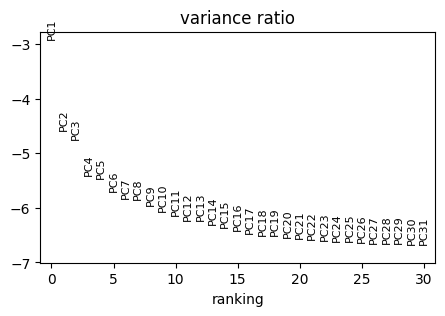

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


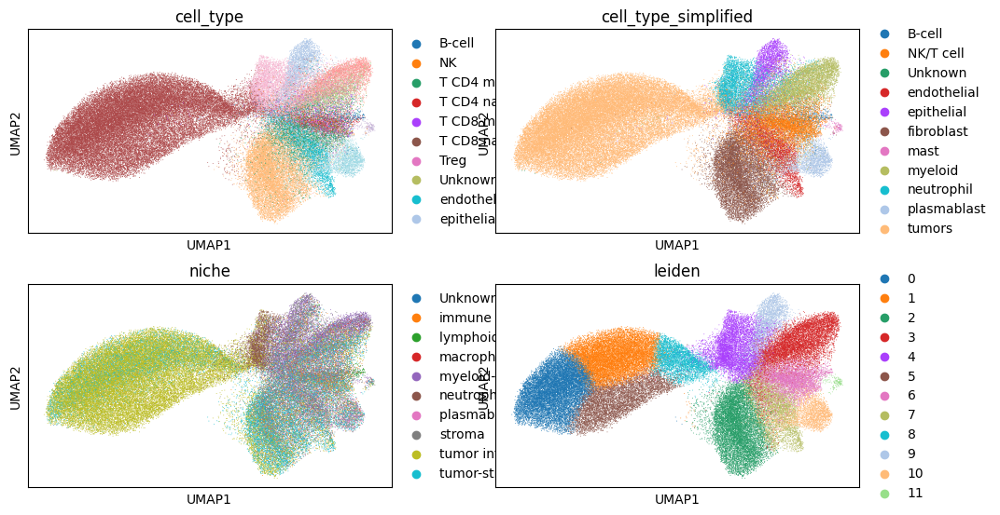

In [91]:
adata_lung9 = preprocess_subsample(adata, ['lung9_rep1'], n_neighbours=30, n_pcs=30, plot_covariates=['cell_type', 'cell_type_simplified', 'niche'])

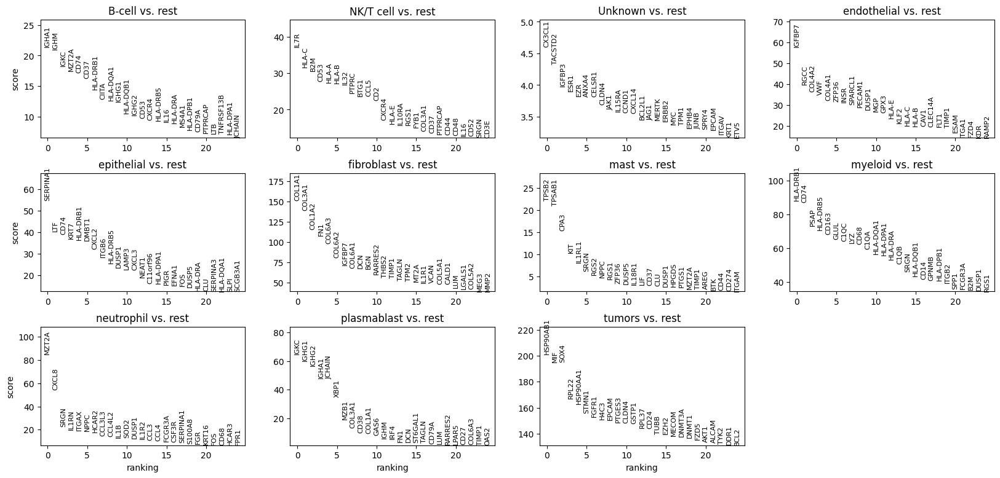

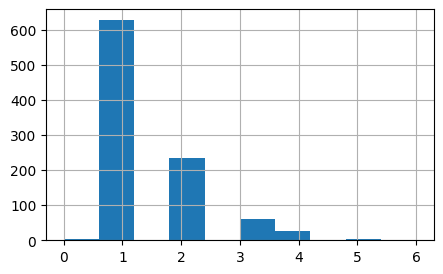

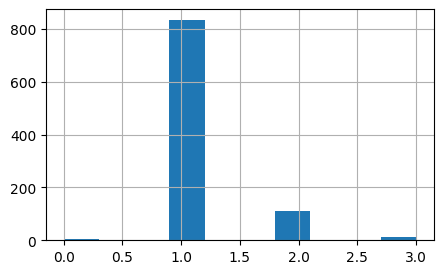

tumors_adjPval         734
neutrophil_adjPval      33
fibroblast_adjPval      63
endothelial_adjPval     43
NK/T cell_adjPval       59
epithelial_adjPval      31
myeloid_adjPval        106
plasmablast_adjPval      9
B-cell_adjPval          12
mast_adjPval             5
Unknown_adjPval          0
dtype: int64


In [94]:
adata_lung9, markers_cell_typesimp = cell_signatures(adata_lung9, 'cell_type_simplified', ratio_threshold=3)

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


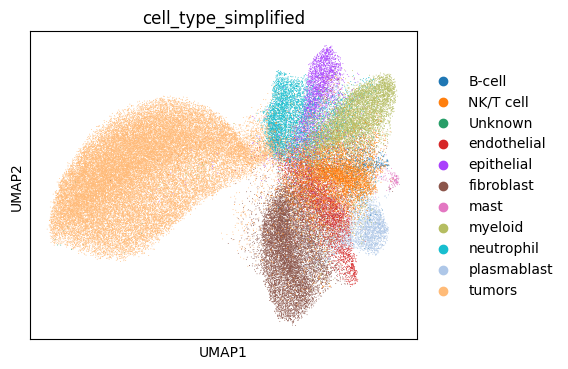

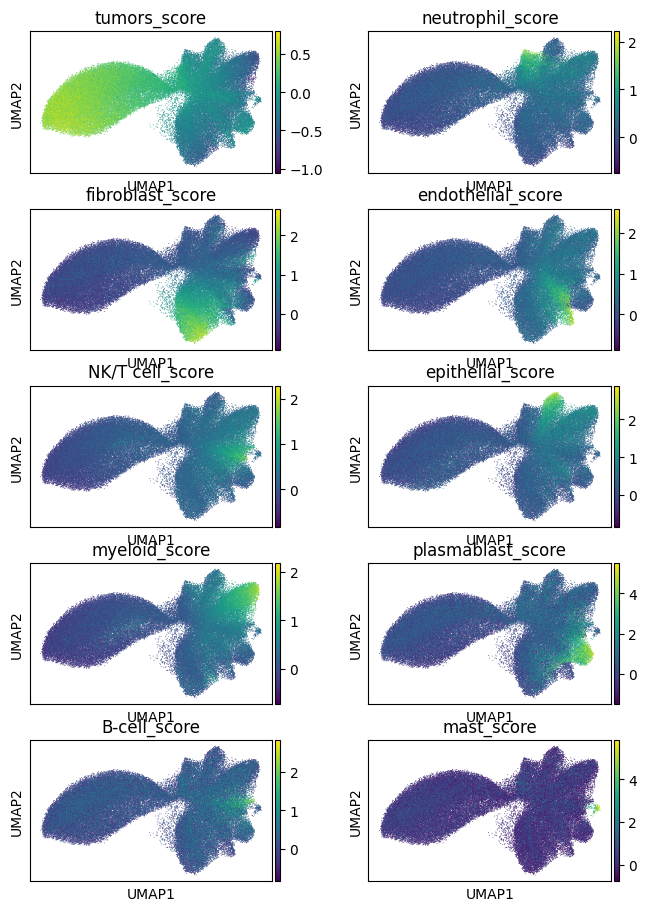

True     44932
False    32471
Name: cell_type_predicted_ok, dtype: int64
cell_type_simplified  cell_type_predicted_ok
B-cell                False                       456
                      True                        220
NK/T cell             False                      4235
                      True                       2168
Unknown               False                        12
endothelial           True                       2598
                      False                       987
epithelial            True                       2354
                      False                       724
fibroblast            True                       9423
                      False                      1886
mast                  True                        203
                      False                         9
myeloid               True                       4386
                      False                      2442
neutrophil            False                      2771
                  

In [95]:
adata_lung9 = score_cells(adata_lung9, markers_cell_typesimp, 'cell_type_simplified')

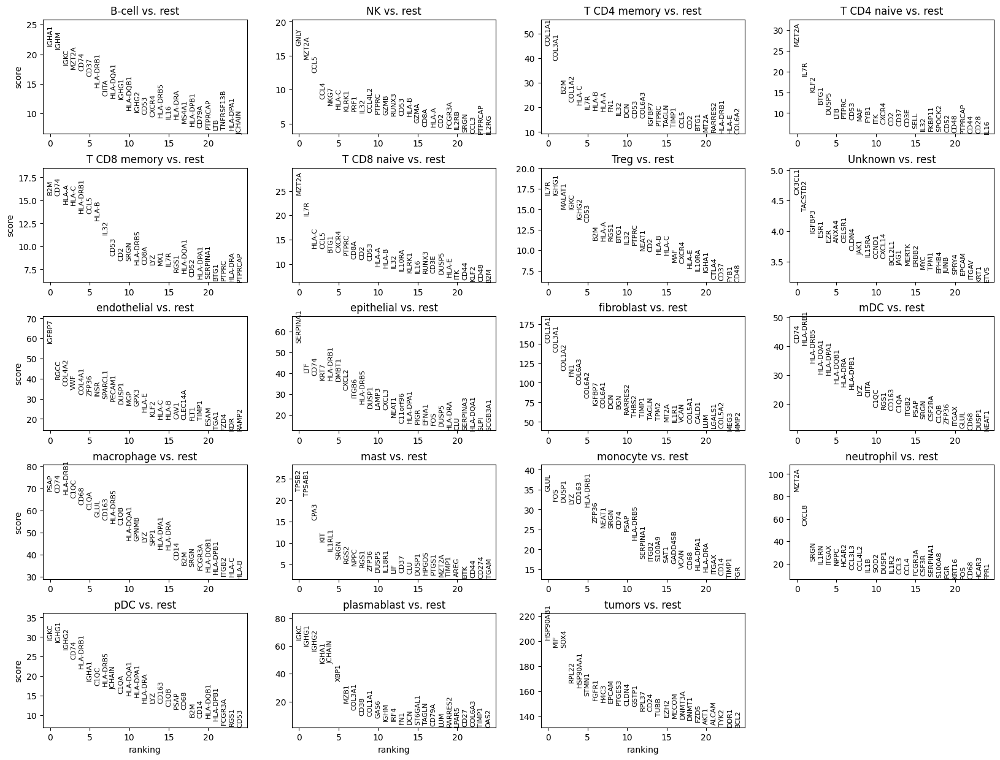

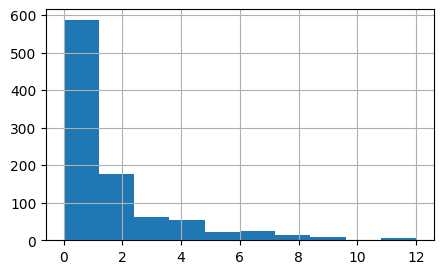

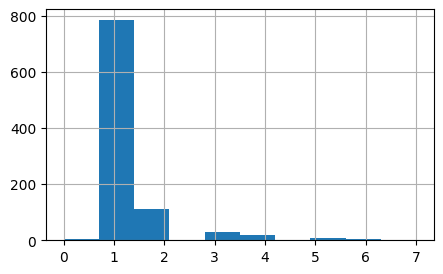

tumors_adjPval          737
neutrophil_adjPval       33
fibroblast_adjPval       64
endothelial_adjPval      41
T CD8 memory_adjPval     19
T CD4 memory_adjPval     35
T CD4 naive_adjPval      29
NK_adjPval               10
epithelial_adjPval       30
macrophage_adjPval       94
monocyte_adjPval         33
Treg_adjPval             27
plasmablast_adjPval       9
mDC_adjPval              26
pDC_adjPval               5
T CD8 naive_adjPval      27
B-cell_adjPval           17
mast_adjPval              5
Unknown_adjPval           0
dtype: int64


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


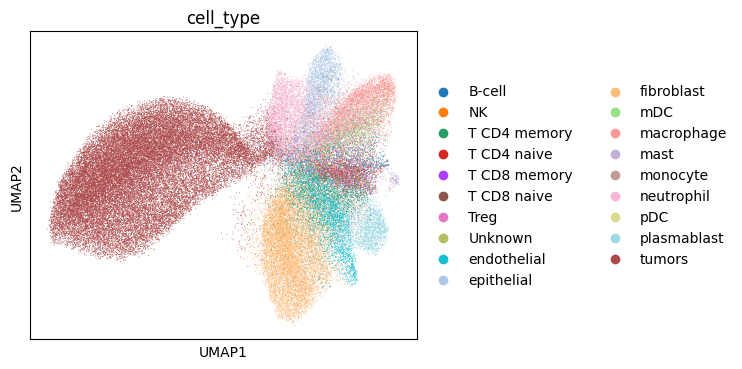

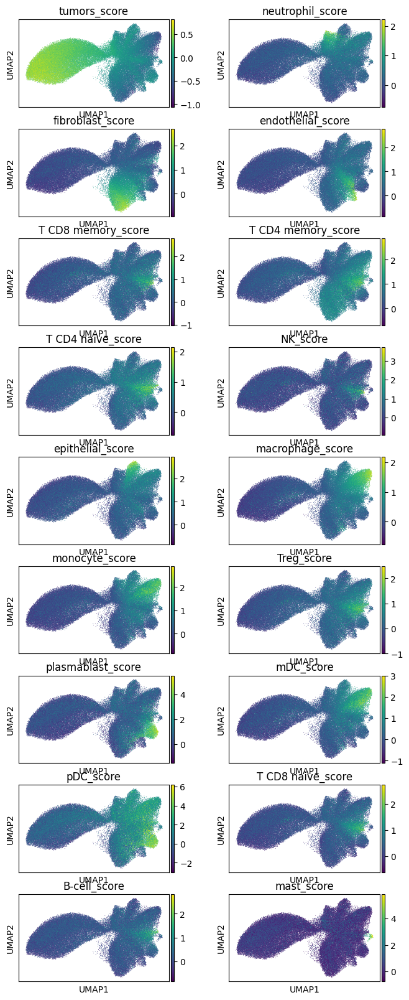

False    44525
True     32878
Name: cell_type_predicted_ok, dtype: int64
cell_type     cell_type_predicted_ok
B-cell        False                       616
              True                         60
NK            False                       317
              True                        219
T CD4 memory  False                      1271
              True                       1168
T CD4 naive   False                       509
              True                        180
T CD8 memory  False                       617
              True                         53
T CD8 naive   False                       929
              True                        169
Treg          False                       938
              True                         33
Unknown       False                        12
endothelial   True                       1984
              False                      1601
epithelial    False                      1636
              True                       1442
fibroblast    Tr

In [96]:
adata_lung9, markers_cell_type = cell_signatures(adata_lung9, 'cell_type', ratio_threshold=3)
adata_lung9 = score_cells(adata_lung9, markers_cell_type, 'cell_type')

### Without tumor cells

(39419, 960)


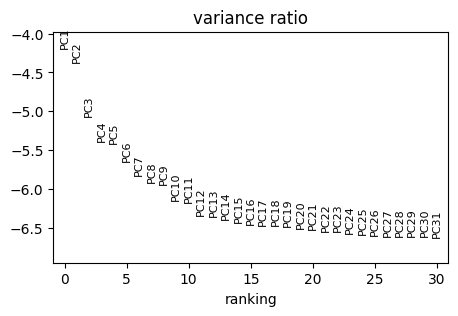

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


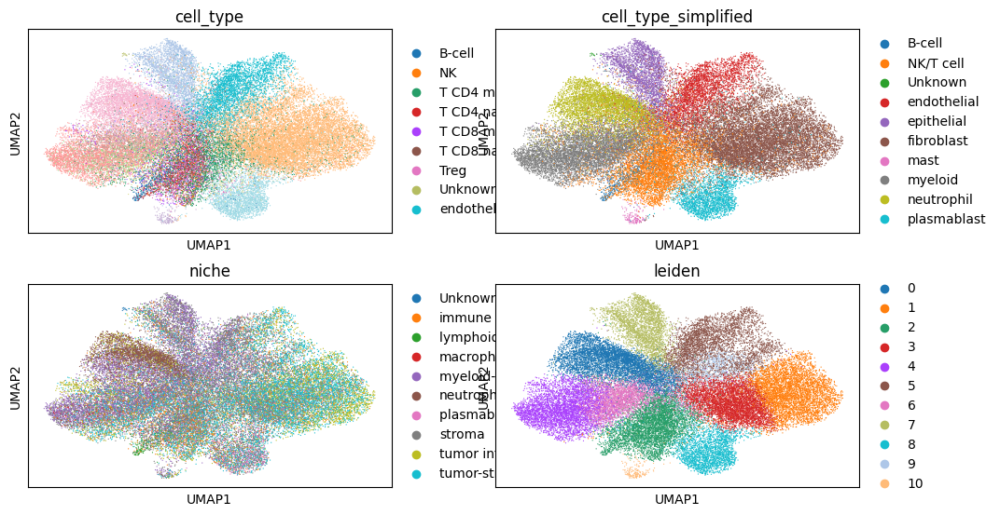

In [330]:
adata_lung9_notumor = preprocess_subsample(adata, ['lung9_rep1'], exclude_cells={'cell_type': ['tumors']}, n_neighbours=30, n_pcs=30, plot_covariates=['cell_type', 'cell_type_simplified', 'niche'])

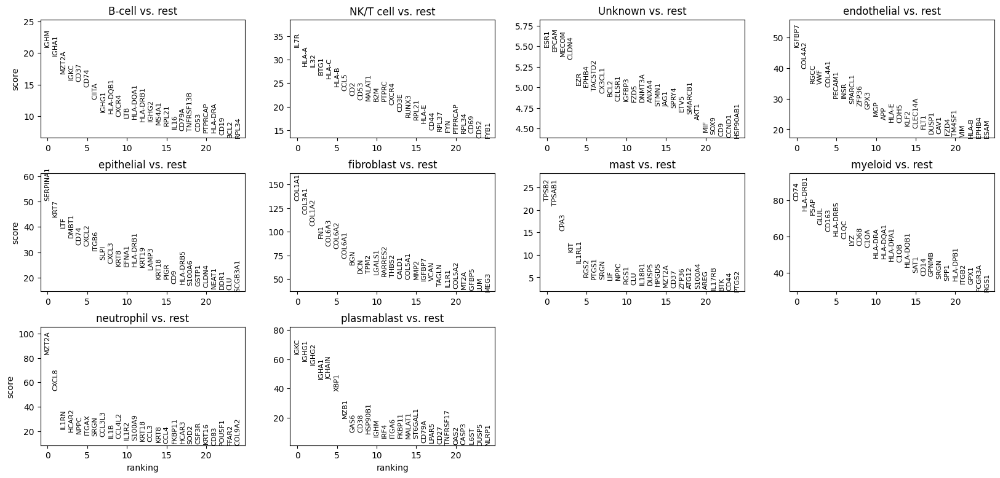

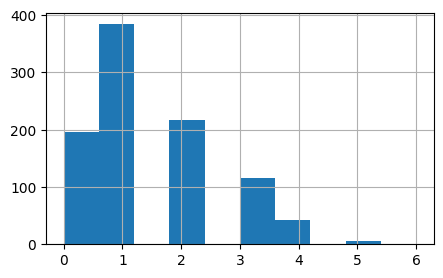

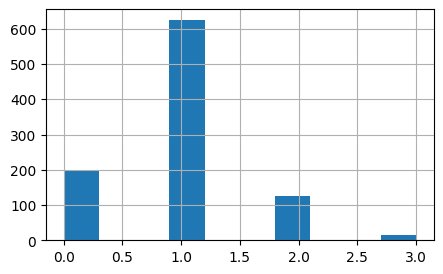

neutrophil_adjPval     141
fibroblast_adjPval     129
endothelial_adjPval     93
NK/T cell_adjPval      120
epithelial_adjPval     126
myeloid_adjPval        161
plasmablast_adjPval     14
B-cell_adjPval          20
mast_adjPval             8
Unknown_adjPval        106
dtype: int64


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


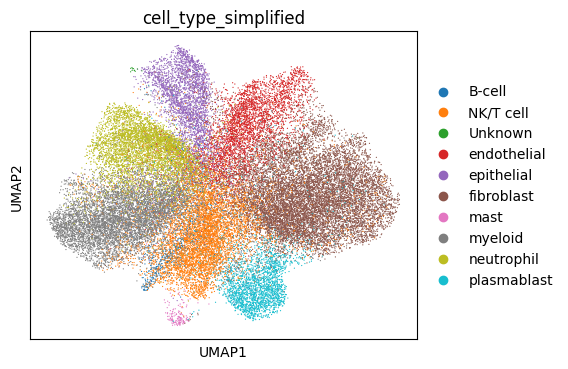

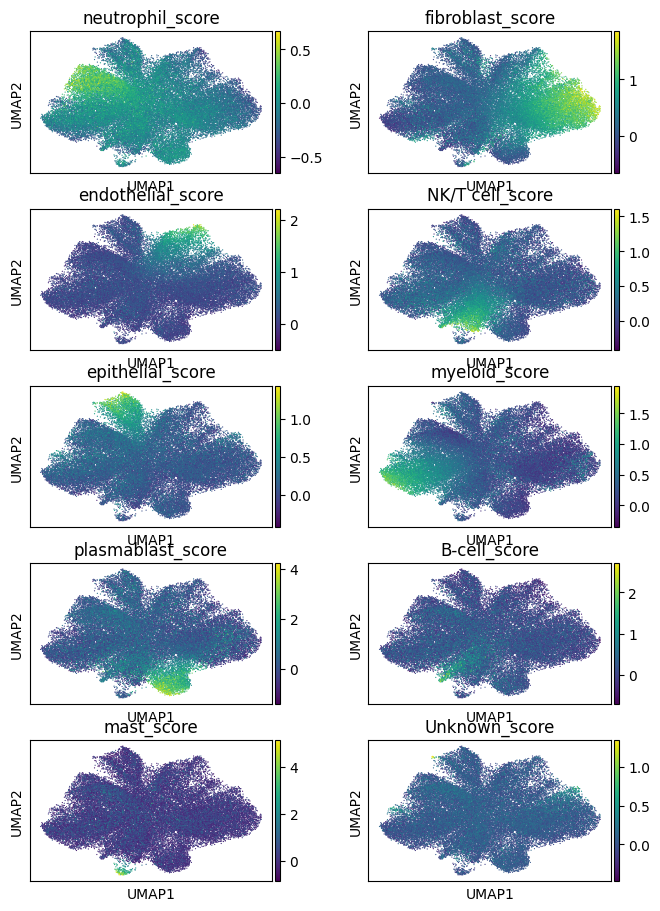

True     25840
False    13579
Name: cell_type_predicted_ok, dtype: int64
cell_type_simplified  cell_type_predicted_ok
B-cell                False                      363
                      True                       313
NK/T cell             False                     3327
                      True                      3076
Unknown               True                        10
                      False                        2
endothelial           True                      2485
                      False                     1100
epithelial            True                      1907
                      False                     1171
fibroblast            True                      9519
                      False                     1790
mast                  True                       204
                      False                        8
myeloid               True                      5260
                      False                     1568
neutrophil            False       

In [331]:
adata_lung9_notumor, markers_cell_typesimp_notumor = cell_signatures(adata_lung9_notumor, 'cell_type_simplified', ratio_threshold=2)
adata_lung9_notumor = score_cells(adata_lung9_notumor, markers_cell_typesimp_notumor, 'cell_type_simplified')

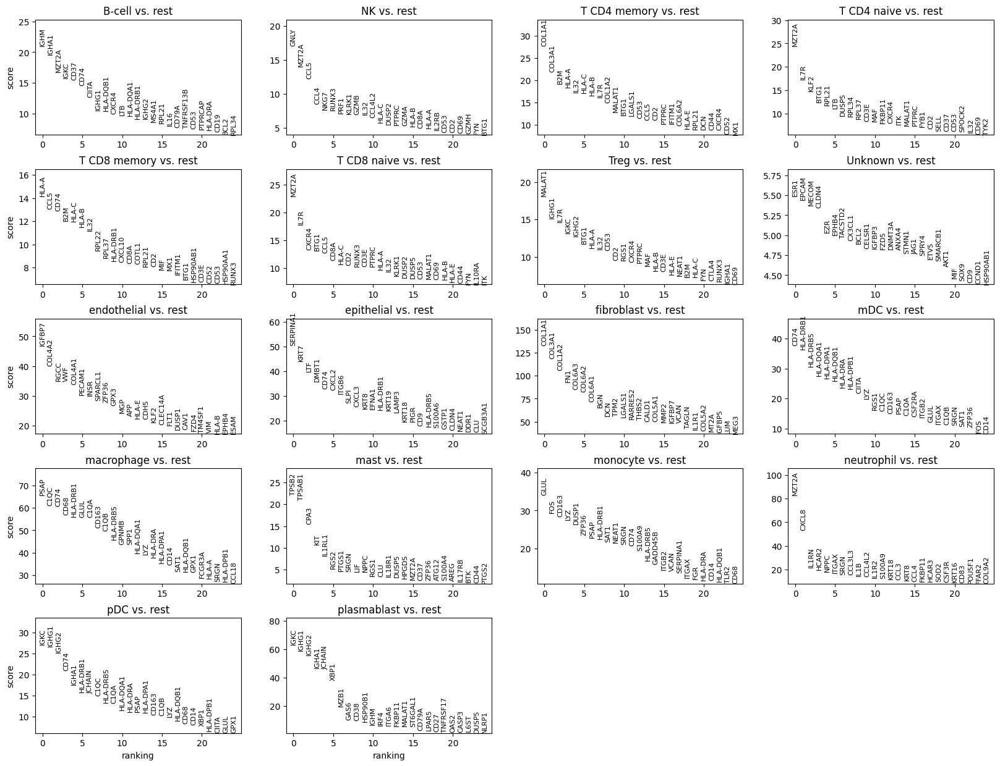

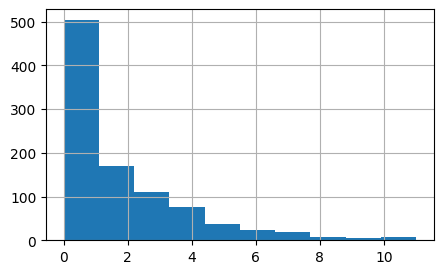

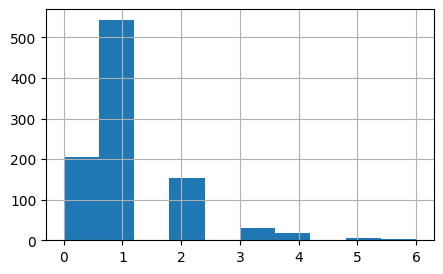

neutrophil_adjPval      144
fibroblast_adjPval      127
endothelial_adjPval      94
T CD8 memory_adjPval     33
T CD4 memory_adjPval     37
T CD4 naive_adjPval      47
NK_adjPval               14
epithelial_adjPval      128
macrophage_adjPval      139
monocyte_adjPval         36
Treg_adjPval             37
plasmablast_adjPval      14
mDC_adjPval              21
pDC_adjPval               2
T CD8 naive_adjPval      48
B-cell_adjPval           32
mast_adjPval              8
Unknown_adjPval         110
dtype: int64


/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


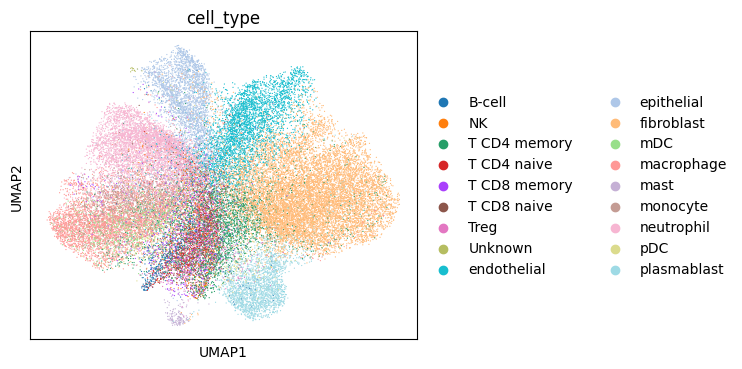

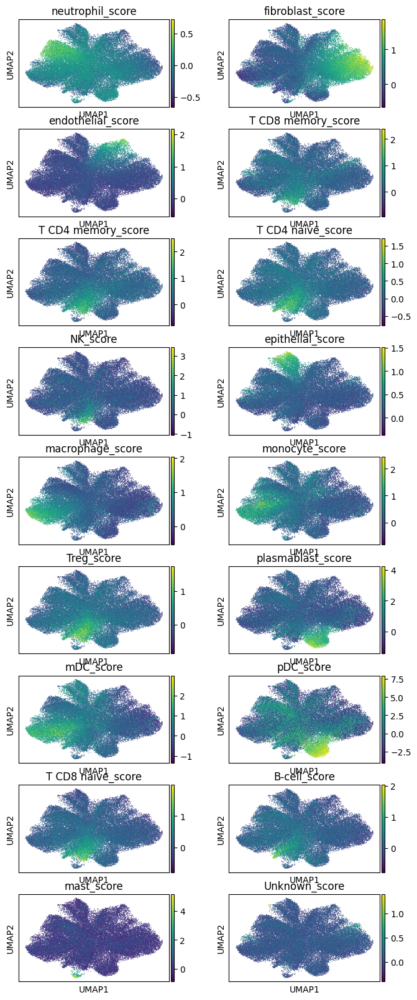

False    23126
True     16293
Name: cell_type_predicted_ok, dtype: int64
cell_type     cell_type_predicted_ok
B-cell        False                      577
              True                        99
NK            True                       273
              False                      263
T CD4 memory  False                     1786
              True                       653
T CD4 naive   False                      534
              True                       155
T CD8 memory  False                      555
              True                       115
T CD8 naive   False                      987
              True                       111
Treg          False                      876
              True                        95
Unknown       True                        10
              False                        2
endothelial   False                     1951
              True                      1634
epithelial    False                     1722
              True                 

In [332]:
adata_lung9_notumor, markers_cell_type_notumor = cell_signatures(adata_lung9_notumor, 'cell_type', ratio_threshold=2)
adata_lung9_notumor = score_cells(adata_lung9_notumor, markers_cell_type_notumor, 'cell_type')

## Cluster sample 5

(93250, 960)


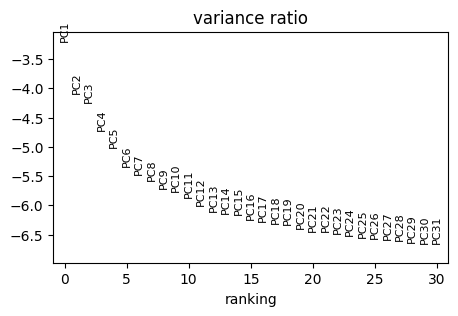

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


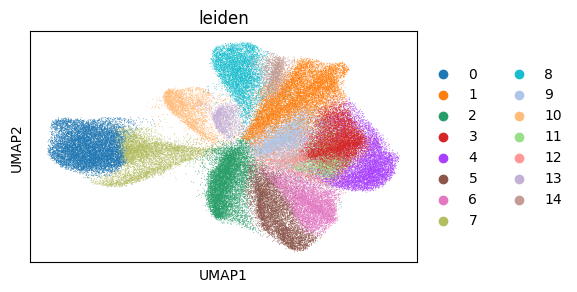

In [93]:
adata_lung5_r1 = preprocess_subsample(adata, ['lung5_rep1'], n_neighbours=30, n_pcs=30, plot_covariates=[])

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


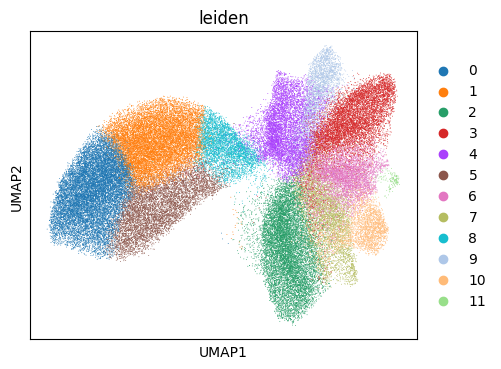

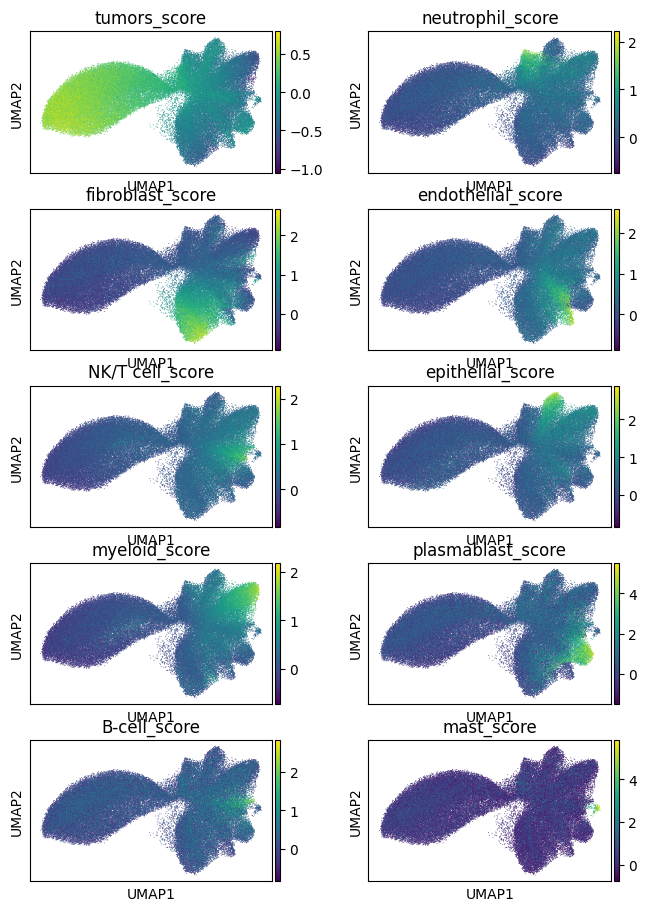

False    77403
Name: cell_type_predicted_ok, dtype: int64
leiden  cell_type_predicted_ok
0       False                     13734
1       False                     12271
2       False                     10232
3       False                      7942
4       False                      6916
5       False                      6492
6       False                      5149
7       False                      4726
8       False                      4149
9       False                      2821
10      False                      2780
11      False                       191
Name: cell_type_predicted_ok, dtype: int64


In [341]:
adata_lung5_r1 = score_cells(adata_lung5_r1, markers_cell_typesimp, 'leiden')

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


(282597, 960)


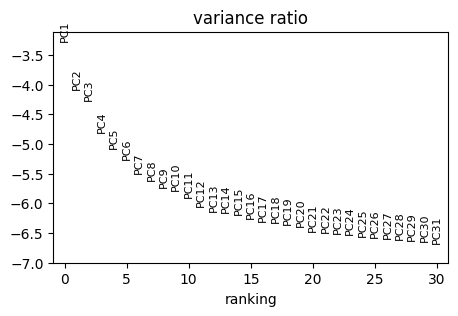

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


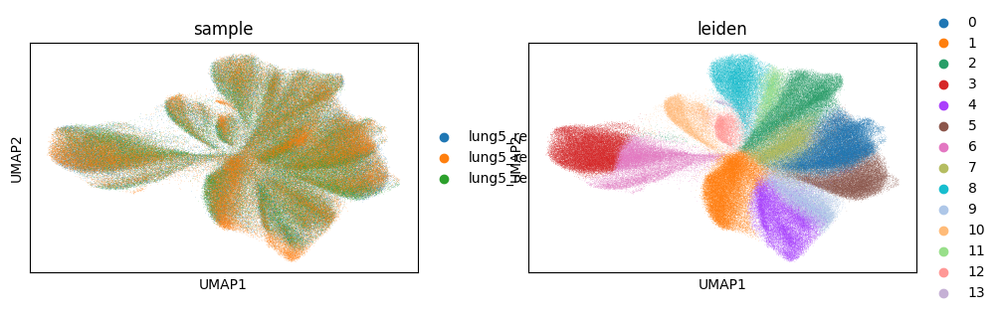

In [97]:
adata_lung5_r123 = preprocess_subsample(adata, ['lung5_rep1','lung5_rep2','lung5_rep3'], n_neighbours=30, n_pcs=30, plot_covariates=['sample'])

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


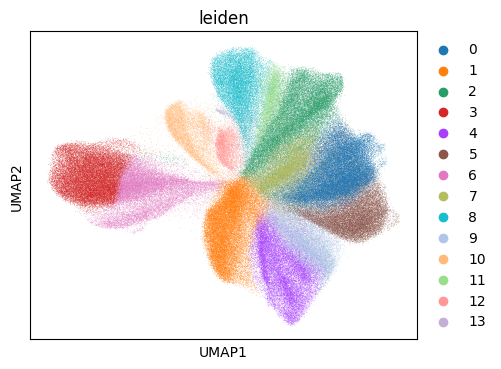

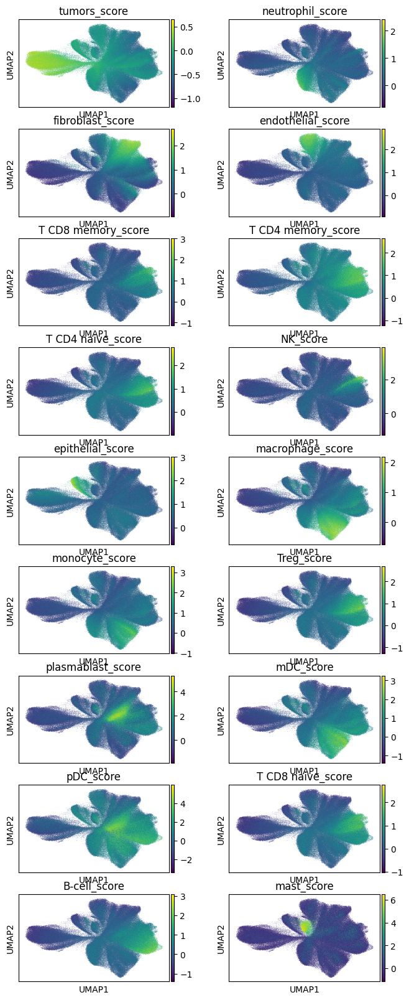

False    282597
Name: cell_type_predicted_ok, dtype: int64
leiden  cell_type_predicted_ok
0       False                     40583
1       False                     32707
2       False                     30111
3       False                     29603
4       False                     23755
5       False                     23735
6       False                     22426
7       False                     18864
8       False                     18550
9       False                     17649
10      False                     10473
11      False                      6767
12      False                      6407
13      False                       967
Name: cell_type_predicted_ok, dtype: int64


In [161]:
adata_lung5_r123 = score_cells(adata_lung5_r123, markers_cell_type, 'leiden')

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


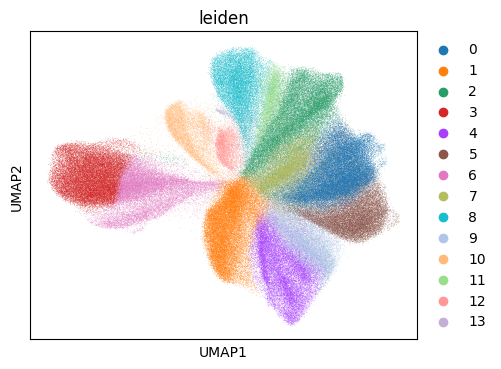

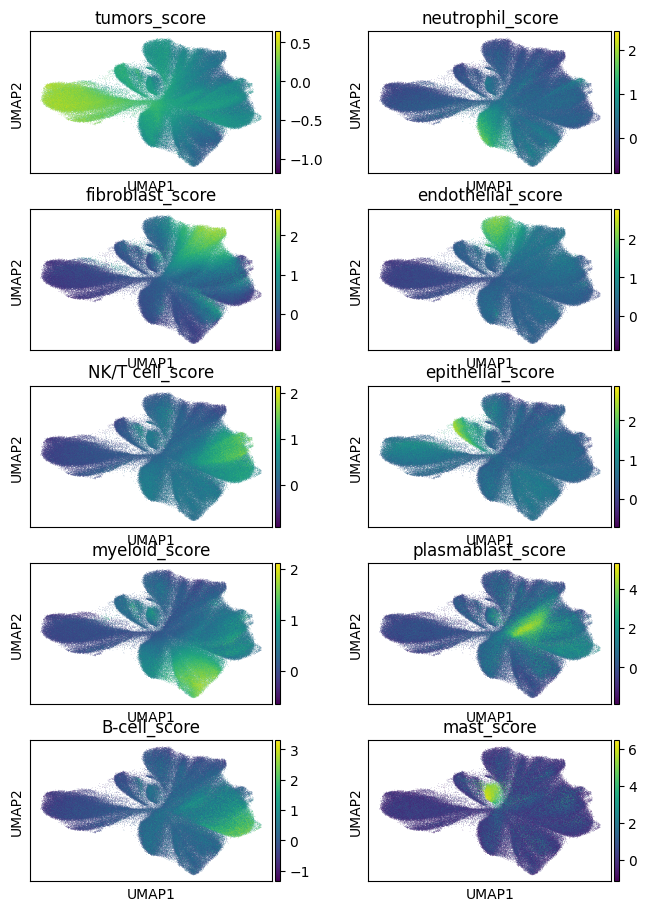

False    282597
Name: cell_type_predicted_ok, dtype: int64
leiden  cell_type_predicted_ok
0       False                     40583
1       False                     32707
2       False                     30111
3       False                     29603
4       False                     23755
5       False                     23735
6       False                     22426
7       False                     18864
8       False                     18550
9       False                     17649
10      False                     10473
11      False                      6767
12      False                      6407
13      False                       967
Name: cell_type_predicted_ok, dtype: int64


In [344]:
adata_lung5_r123 = score_cells(adata_lung5_r123, markers_cell_typesimp, 'leiden')

# Classifier

In [123]:
from sklearn import ensemble
from sklearn import linear_model
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight

In [146]:
def classify(adata_train, adata_test, y_col, model_config, train_pct=0.8):
    model_store = {}
    
    # Exclude unknown
    adata_train = adata_train[adata_train.obs[y_col] != 'Unknown',:]
    
    # train-val , X-y split
    val_id = int(np.trunc(adata_train.shape[0] * train_pct))
    X_train = np.array(adata_train.raw.X[0:val_id,:].todense())
    y_train = adata_train.obs[y_col].astype(str).values[0:val_id]
    X_val = np.array(adata_train.raw.X[val_id:,:].todense())
    y_val = adata_train.obs[y_col].astype(str).values[val_id:]
    X_test = np.array(adata_test.raw.X.todense())
    
    # Train models
    for model in model_config:
        print(model['name'])

        # Scale
        scaler = StandardScaler().fit(X_train)
        X_train = scaler.transform(X_train)
        X_val = scaler.transform(X_val)    
        X_test = scaler.transform(X_test)

        # Fit model
        if model['weight_samples']:
            weight_dict = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
            weight_dict = {cell_type: weight for cell_type, weight in zip(np.unique(y_train), weight_dict)}
            sample_weight = np.array([weight_dict[cell_type] for cell_type in y_train])
            clf = model['model'](**model['parameters']).fit(X_train, y_train, sample_weight)
            
        else:
            clf = model['model'](**model['parameters']).fit(X_train, y_train)
        
        model_store[f'{y_col}_{model["name"]}'] = clf
        
        # Predict
        y_hat_train = clf.predict(X_train)
        y_hat_val = clf.predict(X_val)    
        y_hat_test = clf.predict(X_test)

        # Metrics
        print(f"Train F1 score: {metrics.f1_score(y_train, y_hat_train, average='weighted')}")  
        print(f"Validation F1 score: {metrics.f1_score(y_val, y_hat_val, average='weighted')}")      
        print("Train confuison matrix")    
        contingency = pd.DataFrame(metrics.confusion_matrix(y_train, y_hat_train), index=np.unique(y_val), columns=np.unique(y_val))
        contingency = contingency.div(contingency.sum(axis=1), axis=0)
        sns.clustermap(contingency, cmap='Blues', row_cluster=False, col_cluster=False, figsize=(7, 7))
        plt.show()
        print("Validation confusion matrix")
        contingency = pd.DataFrame(metrics.confusion_matrix(y_val, y_hat_val), index=np.unique(y_val), columns=np.unique(y_val))
        contingency = contingency.div(contingency.sum(axis=1), axis=0)
        sns.clustermap(contingency, cmap='Blues', row_cluster=False, col_cluster=False, figsize=(7, 7))
        plt.show()
        
        # UMAPs
        rcParams['figure.figsize'] = (5, 4)
        adata_train.obs[f'{y_col}_predicted_{model["name"]}'] = np.concatenate((y_hat_train, y_hat_val))
        adata_test.obs[f'{y_col}_predicted_{model["name"]}'] = y_hat_test
        sc.pl.umap(adata_train, color=f'{y_col}_predicted_{model["name"]}', ncols=1)
        sc.pl.umap(adata_test, color=f'{y_col}_predicted_{model["name"]}', ncols=1)
        
    return adata_train, adata_test, model_store

In [128]:
model_config = [
    {'name': 'LR', 'model': linear_model.LogisticRegression, 'parameters': {'max_iter': 3000}, 'weight_samples': False},
    {'name': 'GB', 'model': ensemble.GradientBoostingClassifier, 'parameters': {'random_state': 0, "n_estimators": 50, "max_depth": 2, "min_samples_split": 5, "learning_rate": 0.01}, 'weight_samples': True}
]

LR
Train F1 score: 0.9706877782351535
Validation F1 score: 0.9468623495455823
Train confuison matrix


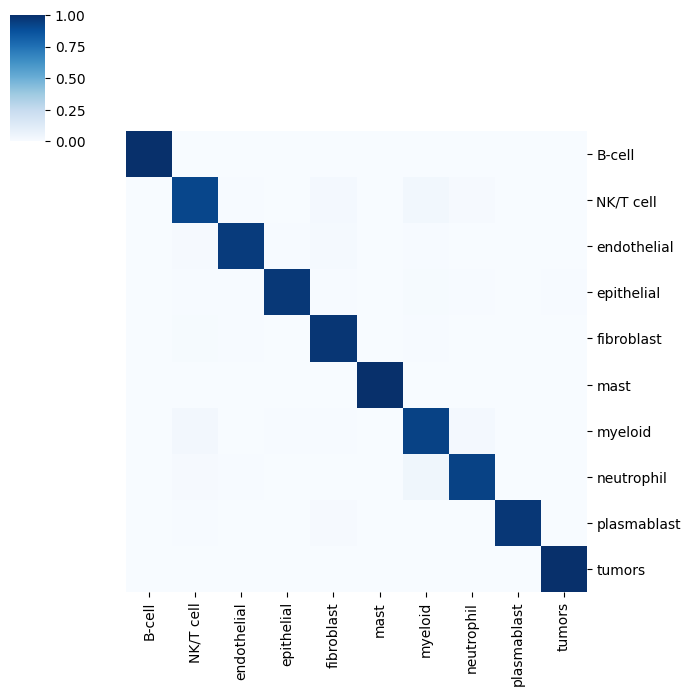

Validation confusion matrix


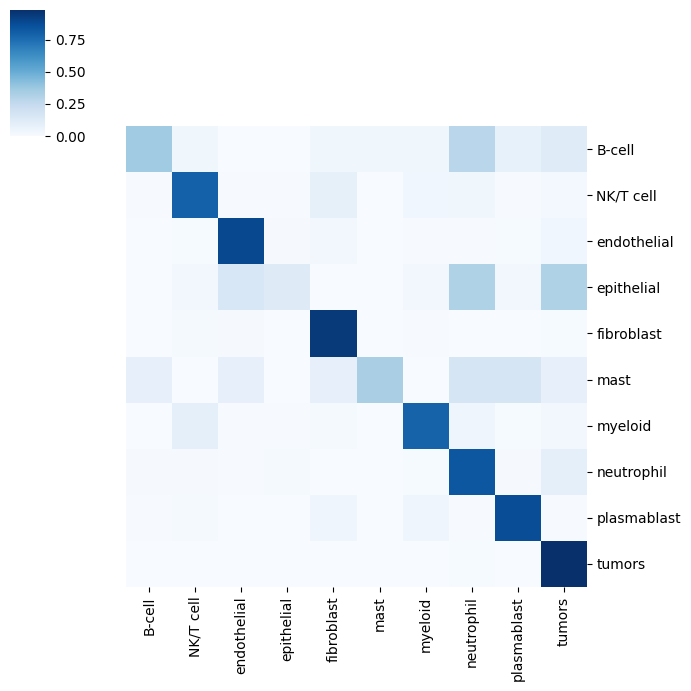

/var/folders/9k/rsnwv_zs49n5zryyfc4myl9d6b36ql/T/ipykernel_48505/1996896737.py:55: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_train.obs[f'{y_col}_predicted_{model["name"]}'] = np.concatenate((y_hat_train, y_hat_val))
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


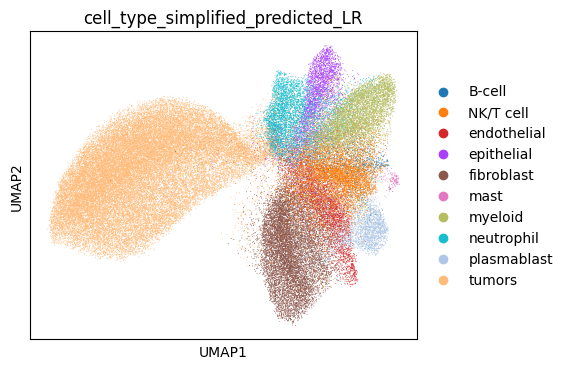

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


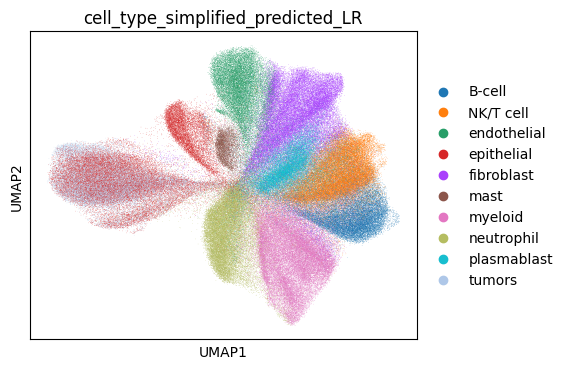

GB
Train F1 score: 0.7903081877486644
Validation F1 score: 0.8752655114359169
Train confuison matrix


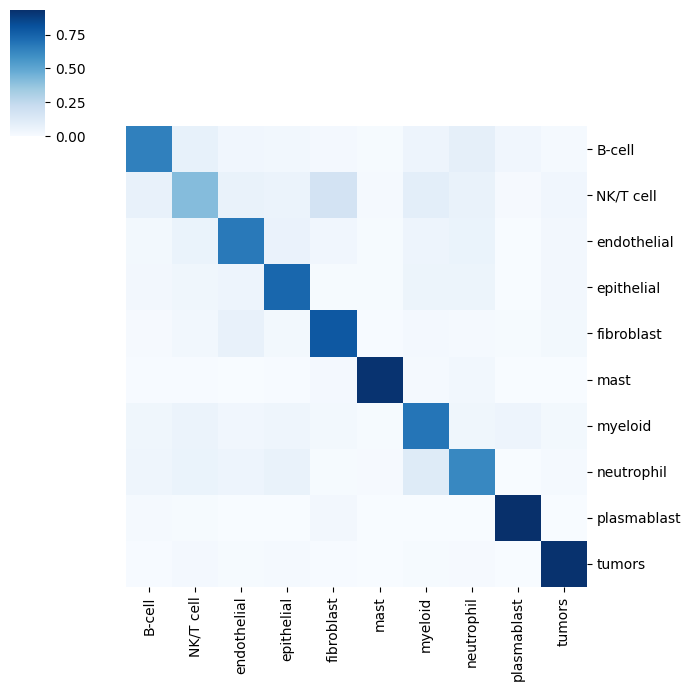

Validation confusion matrix


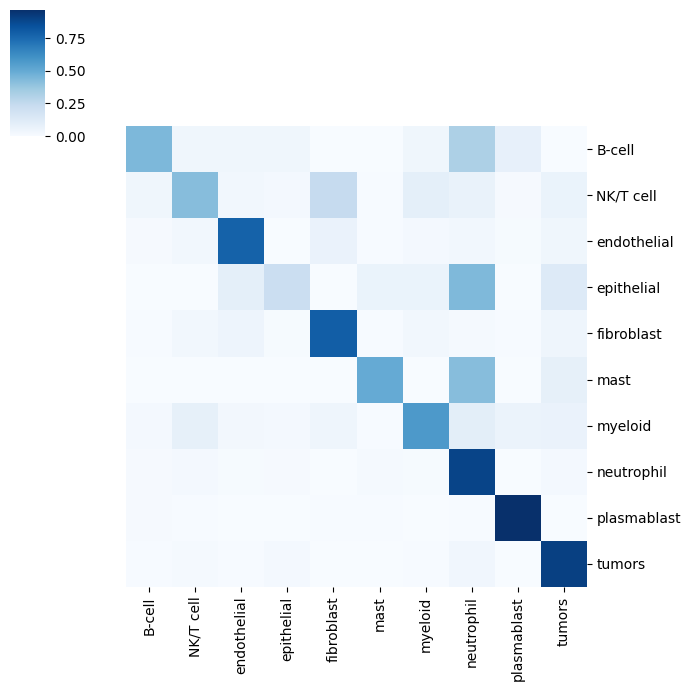

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


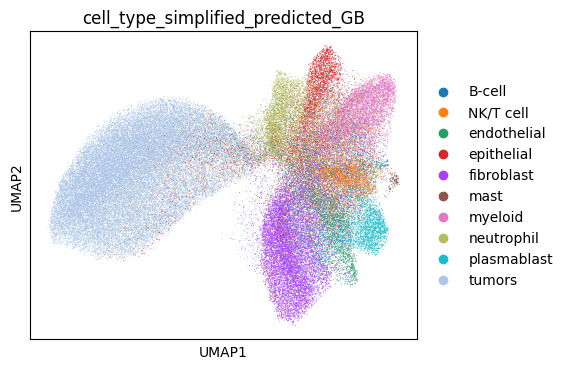

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


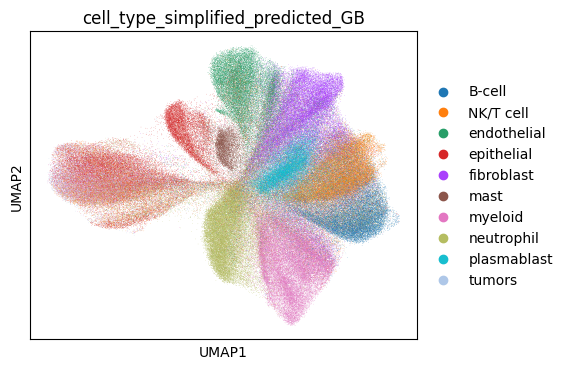

In [147]:
adata_lung9, adata_lung5_r123 = classify(adata_lung9, adata_lung5_r123, 'cell_type_simplified', model_config, train_pct=0.8)

LR
Train F1 score: 0.9975738131253198
Validation F1 score: 0.9355897303437657
Train confuison matrix


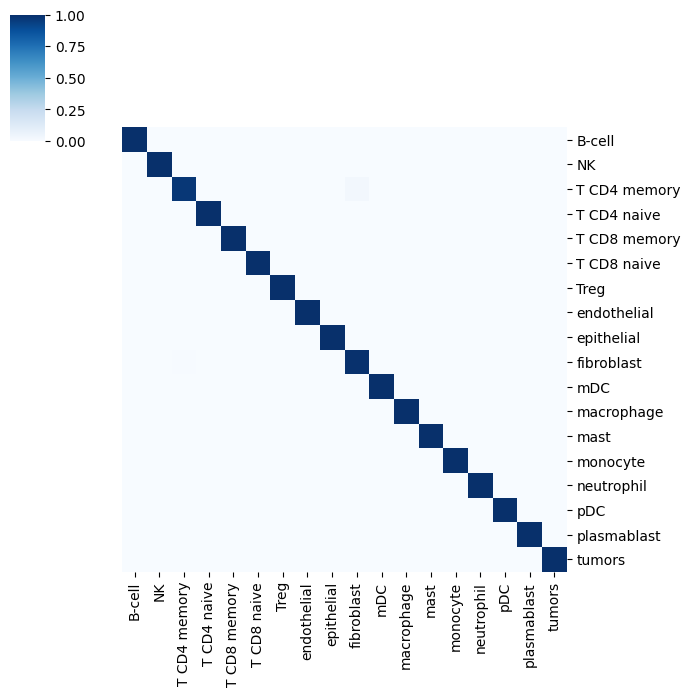

Validation confusion matrix


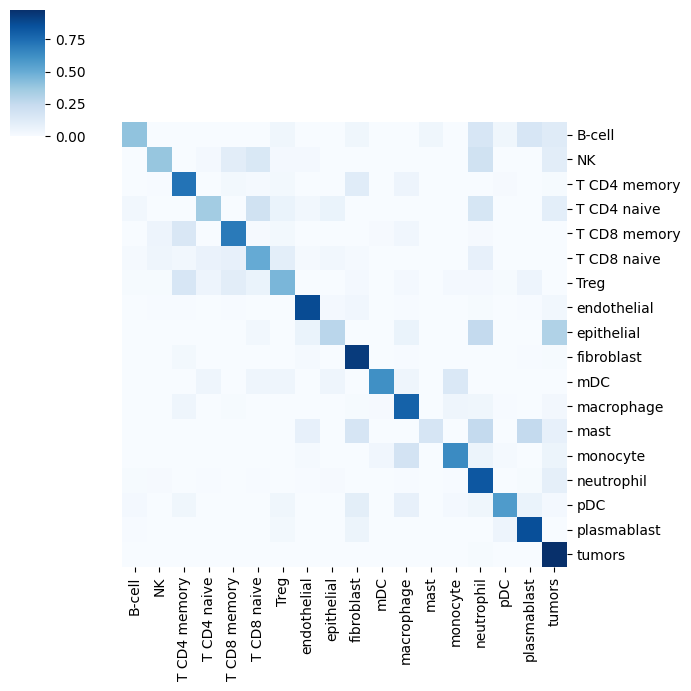

/var/folders/9k/rsnwv_zs49n5zryyfc4myl9d6b36ql/T/ipykernel_48505/1996896737.py:55: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_train.obs[f'{y_col}_predicted_{model["name"]}'] = np.concatenate((y_hat_train, y_hat_val))
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


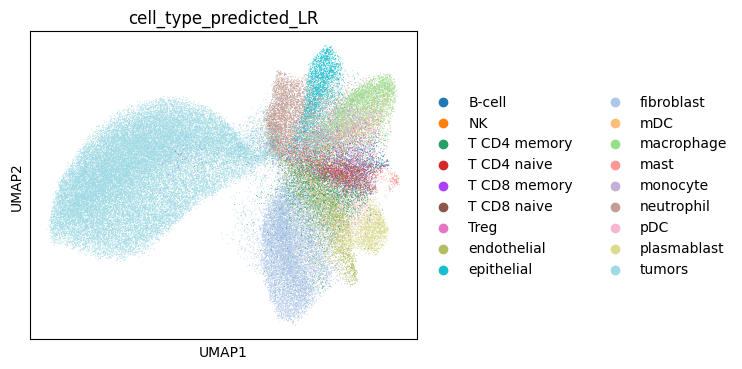

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


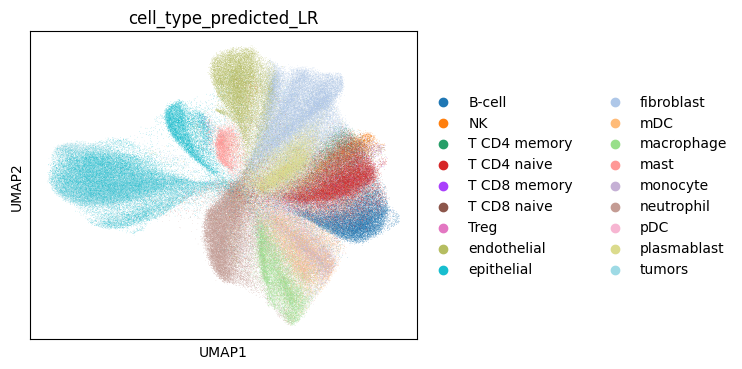

GB
Train F1 score: 0.7428935477792586
Validation F1 score: 0.8492675367205209
Train confuison matrix


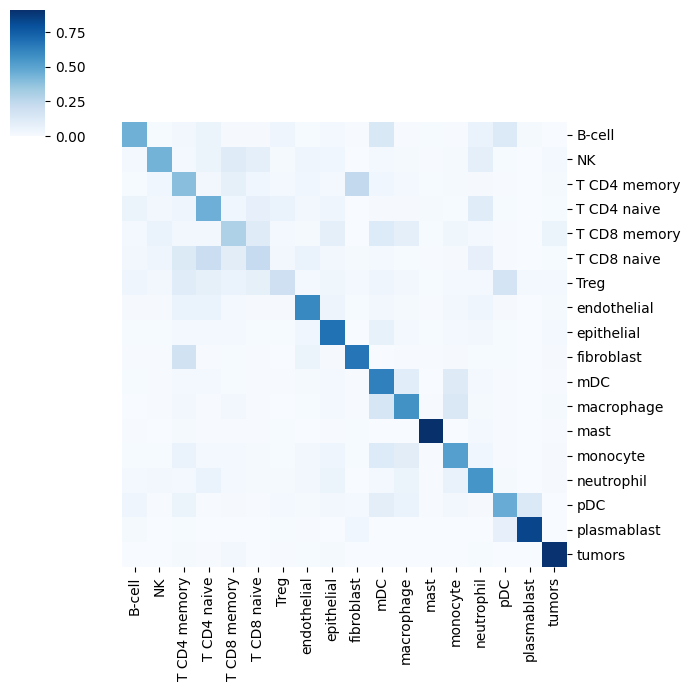

Validation confusion matrix


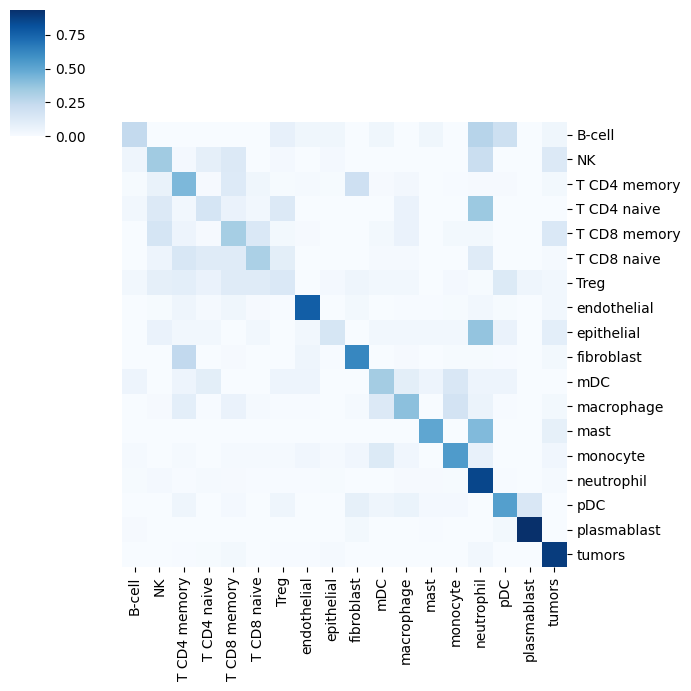

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


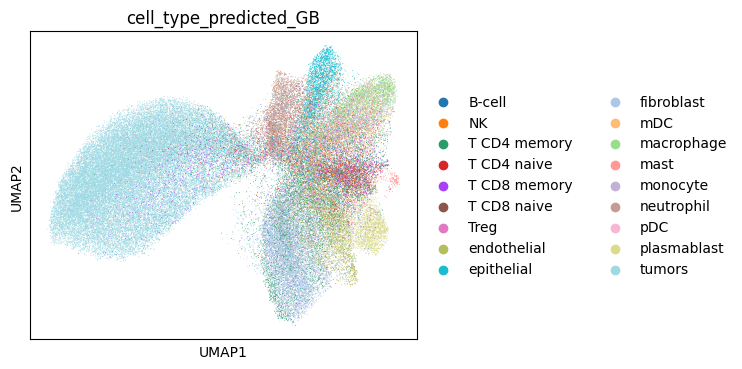

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


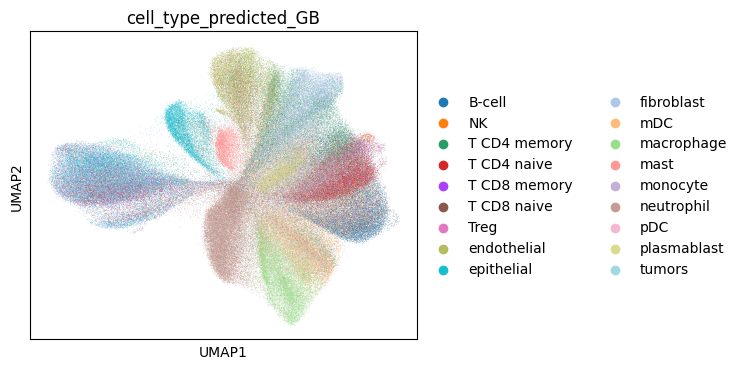

In [148]:
adata_lung9, adata_lung5_r123 = classify(adata_lung9, adata_lung5_r123, 'cell_type', model_config, train_pct=0.8)

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


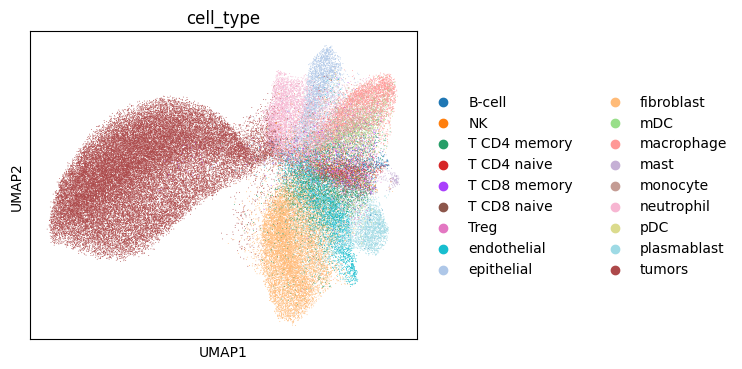

In [151]:
adata_lung9 = adata_lung9[adata_lung9.obs['cell_type'] != 'Unknown',:]
sc.pl.umap(adata_lung9[adata_lung9.obs['cell_type'] != 'Unknown',:], color='cell_type', ncols=1)

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


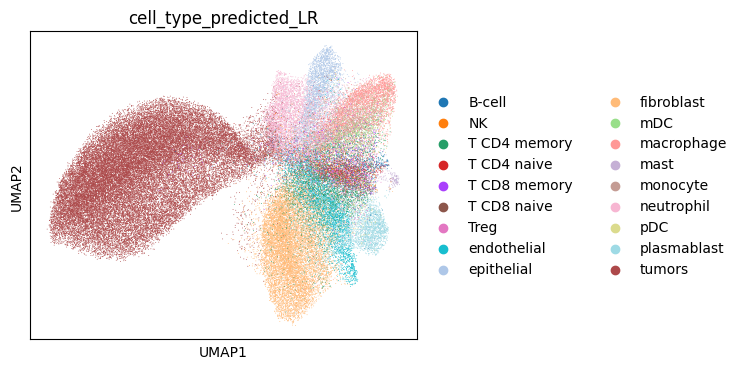

In [160]:
sc.pl.umap(adata_lung9, color='cell_type_predicted_LR', ncols=1)

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


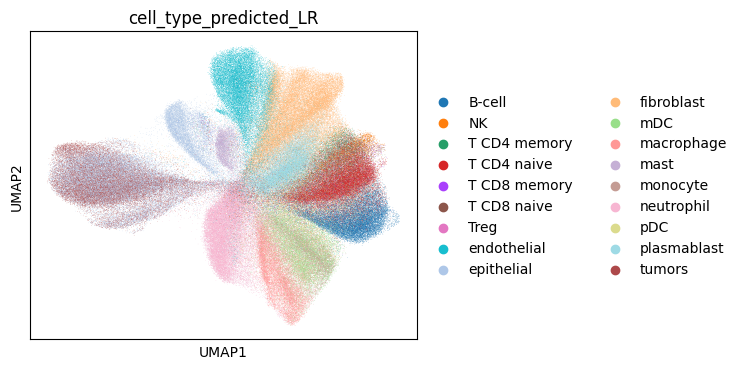

In [165]:
rcParams['figure.figsize'] = (5, 4)
adata_lung5_r123.uns['cell_type_predicted_LR_colors'] = adata_lung9.uns['cell_type_predicted_LR_colors']
sc.pl.umap(adata_lung5_r123, color='cell_type_predicted_LR', ncols=1)

/var/folders/9k/rsnwv_zs49n5zryyfc4myl9d6b36ql/T/ipykernel_48505/1752910075.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_lung9.obs['cell_type'] = adata_lung9.obs['cell_type'].astype(str)
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


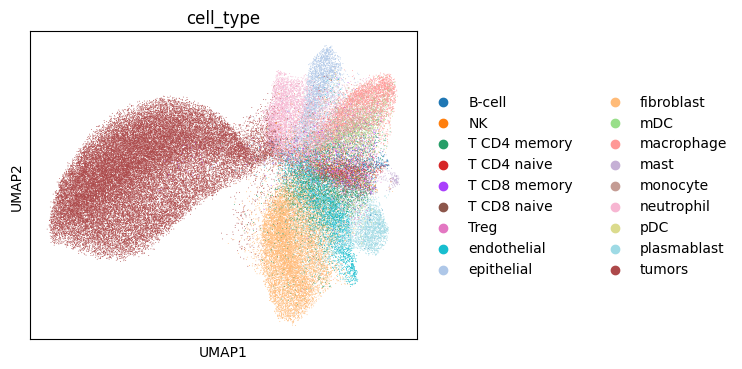

In [154]:
adata_lung9.obs['cell_type'] = adata_lung9.obs['cell_type'].astype(str)
sc.pl.umap(adata_lung9, color='cell_type', ncols=1)

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


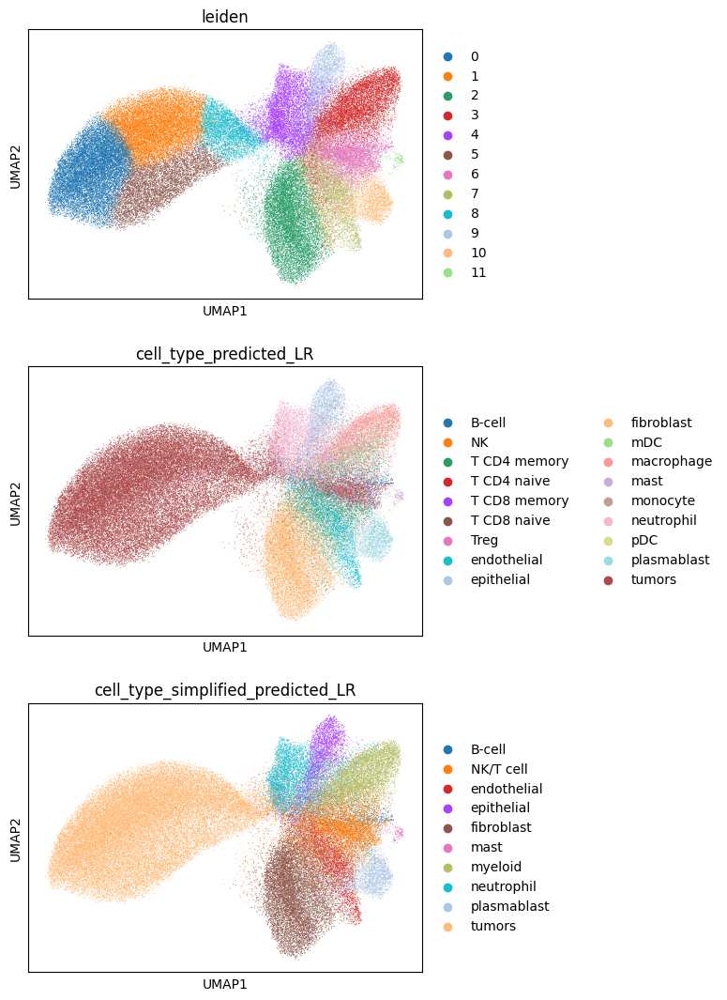

In [170]:
sc.pl.umap(adata_lung9, color=['leiden','cell_type_predicted_LR','cell_type_simplified_predicted_LR'], ncols=1)

In [174]:
leiden2cell = {'0': 'NK/T cell', '1': 'neutrophil', '2': 'fibroblast', '3': 'tumors', '4': 'myeloid', '5': 'B-cell', '6': 'tumors', '7': 'plasmablasts', '8': 'endothelial', 
 '9': 'myeloid', '10': 'epithelial', '11': 'fibrbolblast', '12': 'mast', '13': 'endothelial'}

adata_lung5_r123.obs['annotation'] = [leiden2cell[leiden] for leiden in adata_lung5_r123.obs['leiden'].values]
adata_lung5_r123.obs

,fov,cell_ID,sample,sample_id,replicate_id,cell_type,niche,cell_type_simplified,leiden,cell_type_predicted_LR,...,Treg_score,plasmablast_score,mDC_score,pDC_score,T CD8 naive_score,B-cell_score,mast_score,cell_type_predicted,cell_type_predicted_ok,annotation
1,1,3,lung5_rep1,5,1,Unknown,Unknown,Unknown,8,monocyte,...,-0.068574,0.044034,-0.265925,0.808291,0.119909,0.001660,0.815328,mast,False,endothelial
2,1,4,lung5_rep1,5,1,Unknown,Unknown,Unknown,5,Treg,...,0.189597,0.628568,0.647734,2.974356,0.429026,0.152384,-0.165225,pDC,False,B-cell
3,1,5,lung5_rep1,5,1,Unknown,Unknown,Unknown,4,macrophage,...,-0.214962,-0.507518,0.338330,1.502332,0.056794,-0.166741,0.917004,pDC,False,myeloid
4,1,7,lung5_rep1,5,1,Unknown,Unknown,Unknown,4,macrophage,...,-0.475675,0.013661,1.256517,0.460623,-0.148279,0.152562,0.455031,macrophage,False,myeloid
5,1,9,lung5_rep1,5,1,Unknown,Unknown,Unknown,7,plasmablast,...,0.258854,3.542848,0.346824,2.765464,0.319296,1.131749,-0.244231,plasmablast,False,plasmablasts
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97613,30,4159,lung5_rep2,5,2,Unknown,Unknown,Unknown,2,fibroblast,...,-0.067497,-0.729426,-0.148110,-0.545024,-0.001099,0.189354,-0.154289,fibroblast,False,fibroblast
97614,30,4160,lung5_rep2,5,2,Unknown,Unknown,Unknown,11,fibroblast,...,-0.178174,-0.288205,-0.480138,-0.728615,-0.088574,-0.022151,-0.407973,fibroblast,False,fibrbolblast
97615,30,4161,lung5_rep2,5,2,Unknown,Unknown,Unknown,2,fibroblast,...,-0.529034,-0.236134,-0.656295,-0.862792,-0.289745,-0.540809,0.619032,fibroblast,False,fibroblast
97616,30,4162,lung5_rep2,5,2,Unknown,Unknown,Unknown,2,fibroblast,...,-0.032186,-0.251693,0.016225,-1.035094,0.126917,-0.417353,-0.232902,fibroblast,False,fibroblast


In [177]:
adata_lung5_r123.obs[['cell_type_simplified_predicted_LR','annotation']].value_counts().head(30)

cell_type_simplified_predicted_LR  annotation  
myeloid                            myeloid         36072
NK/T cell                          NK/T cell       30629
fibroblast                         fibroblast      27011
neutrophil                         neutrophil      26633
tumors                             tumors          25888
epithelial                         tumors          25204
B-cell                             B-cell          18464
endothelial                        endothelial     17837
plasmablast                        plasmablasts    16455
epithelial                         epithelial       9699
mast                               mast             5398
fibroblast                         fibrbolblast     4263
endothelial                        fibrbolblast     2208
B-cell                             NK/T cell        2207
fibroblast                         NK/T cell        2020
neutrophil                         myeloid          1954
NK/T cell                          B-cel

In [180]:
annotate = adata_lung5_r123.obs[['fov', 'cell_ID', 'sample', 'sample_id', 'replicate_id', 'annotation']]
annotate.to_csv('../datasets/srt_data/irene_temp/lung5_annotation.csv')

In [ ]:
{'0': 'NK/T cell', '1': 'neutrophil', '2': 'fibroblast', '3': 'tumors', '4': 'myeloid', '5': 'B-cell', '6': 'tumors', '7': 'plasmablasts', '8': 'endothelial', 
 '9': 'myeloid', '10': 'epithelial', '11': 'fibrbolblast', '12': 'mast', '13': 'endothelial'}

/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/irene.bonafonte/miniforge3/envs/nichecompass/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


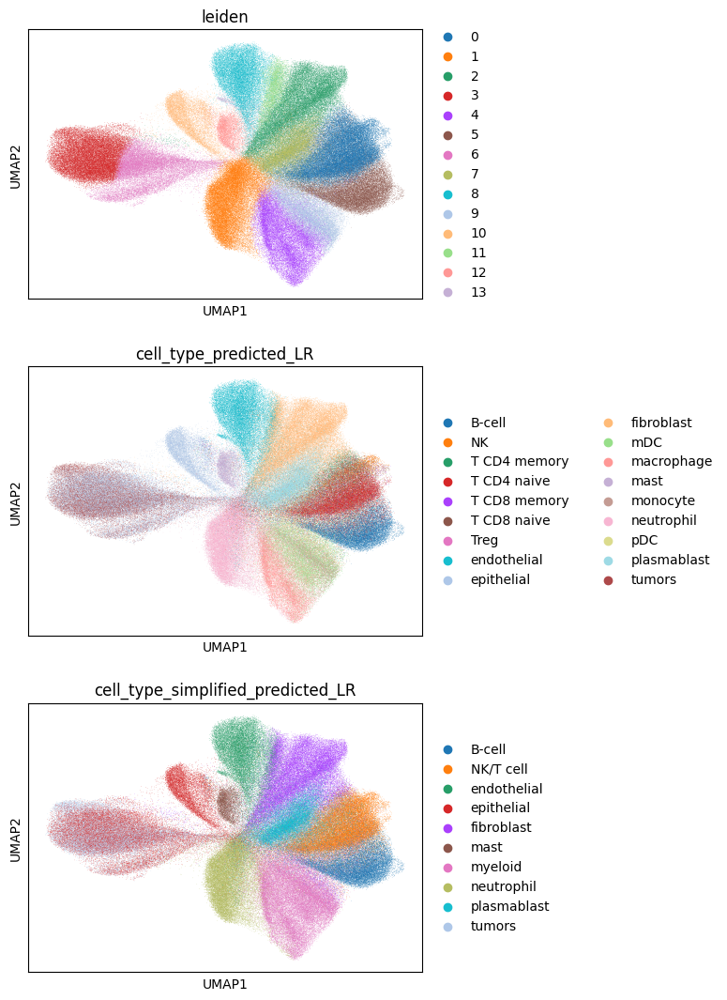

In [169]:
sc.pl.umap(adata_lung5_r123, color=['leiden','cell_type_predicted_LR','cell_type_simplified_predicted_LR'], ncols=1)

In [183]:
import celltypist
from celltypist import models
models.download_models(force_update = True)




📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 19
📂 Storing models in /Users/irene.bonafonte/.celltypist/data/models
💾 Downloading model [1/19]: Immune_All_Low.pkl
💾 Downloading model [2/19]: Immune_All_High.pkl
💾 Downloading model [3/19]: Adult_Mouse_Gut.pkl
💾 Downloading model [4/19]: Autopsy_COVID19_Lung.pkl
🛑 Autopsy_COVID19_Lung.pkl failed 🛑 Cannot fetch 'https://celltypist.cog.sanger.ac.uk/models/Autopsy_COVID19_Delorey/v1/Autopsy_COVID19_Lung.pkl', the error is: HTTPSConnectionPool(host='celltypist.cog.sanger.ac.uk', port=443): Read timed out.
💾 Downloading model [5/19]: COVID19_HumanChallenge_Blood.pkl
💾 Downloading model [6/19]: COVID19_Immune_Landscape.pkl
💾 Downloading model [7/19]: Cells_Fetal_Lung.pkl
💾 Downloading model [8/19]: Cells_Intestinal_Tract.pkl
💾 Downloading model [9/19]: Cells_Lung_Airway.pkl
💾 Downloading model [10/19]: Developing_Human_Brain.pkl
💾 Downloading model [11/19]: Developing_Human_T